<img src="https://www.wallpapertip.com/wmimgs/20-204416_beautiful-daisy-wallpapers-pc-high-resolution-daisy-flower.jpg" width=750 height=500>

<h1>Introducing to the Dataset</h1>

<p style="font-size: 17px;">
    Author: <a href="https://www.kaggle.com/alxmamaev">Alexander Mamaev</a>
</p>

<p style="font-size: 15px;">
    Dataset contains 4242 images of flowers.
    The data collection is based on the data Flicr, Google images, Yandex images.<br>The pictures are divided into five classes: <b>chamomile</b>, <b>tulip</b>, <b>rose</b>, <b>sunflower</b>, <b>dandelion</b>.<br>
For each class there are about 800 photos. Photos are not high resolution, about 320x240 pixels. Photos are not reduced to a single size, they have different proportions!
</p>

<h1>Installing & Importing requirements</h1>

In [1]:
!pip install -q torch
!pip install -q albumentations
!pip install -q seaborn
!pip install -q tqdm
!pip install -q numpy
!pip install -q addict

In [29]:
import torch
from torch import nn
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import models
import albumentations as A
from albumentations.pytorch import ToTensor
from PIL import Image
import numpy as np
import logging
from addict import Dict
import os
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from datetime import datetime, date
import random



logging.basicConfig(format="[%(levelname)s] [%(asctime)s] - %(message)s")

<h1>Classes & Functions</h1>

In [117]:
class FlowersDataset(Dataset):
    def __init__(self, path:str, shape=(256, 256), augmentations=None):
        self.__images_classes_pathes = []
        self.__shape = shape
        self.__augmentations = augmentations
        self.labels = []
            
        if os.path.exists(path):
            self.__path = path
            folders = [_ for _ in os.listdir(self.__path) if _ != "flowers"]

            for folder in folders:
                folder_path = os.path.join(self.__path, folder)
                if os.path.isdir(folder_path) and os.path.exists(folder_path):
                    images = os.listdir(folder_path)
                    self.labels.append(folder)
                    
                    
                    if len(images):
                        for image in images:
                            if image.endswith("jpeg") or image.endswith("png") or image.endswith("jpg"):
                                image_path = os.path.join(folder_path, image)
                                self.__images_classes_pathes.append((folder, image_path))
                    else:
                        message = f"Images for folder '{folder}' weren't found!"
                        print(message)
                else:
                    message = f"'{folder}' is not folder and it will be skipped!"
                    print(message)
                
        else:
            message = f"Path '{path}' does not exists!"
            raise Exception(message)
    
        self.__images_classes_pathes = np.array(self.__images_classes_pathes)
        
    
    
    
    def __load_image(self, path, channels="RGB"):
        width, height = self.__shape
        loader = A.Compose([
            A.Resize(width, height),
            ToTensor(),
        ])
        
        image = np.array(Image.open(path).convert(channels))
        return loader(image=image)["image"]
    
    def __len__(self):
        return len(self.__images_classes_pathes)
    
    
    def __getitem__(self, index):
        item = self.__images_classes_pathes[index]
        label, image_path = item
        
        image = self.__load_image(image_path, channels="RGB")
        
        if self.__augmentations is not None:
            image = self.__augmentations(image=image.permute(1, 2, 0).numpy())["image"]
        
        label = self.labels.index(label)
        
        return Dict({
            "label": label,
            "image": image
        })
    
    
class Trainer:
    def __init__(self, model, criterion, optimizer, scheduler=None, metric=None, device="cpu"):
        self.__model = model
        self.__criterion = criterion
        self.__optimizer = optimizer
        self.__scheduler = scheduler
        self.__metric = metric
        self.__device = device
        self.logs = Dict({})
        
        
    def __log(self, logs):
        for k,v in logs.items():
            if k not in self.logs.keys():
                self.logs[k] = []
                
            self.logs[k].append(v)
        
        
    def __make_checkpoint(self, info, path=f"checkpoints/checkpoint.pt"):
        checkpoint_info = {
           **info,
            "optimizer_state": self.__optimizer.state_dict(),
            "model_state": self.__model.state_dict(),
        }
        
        torch.save(checkpoint_info, path)
    
    
    def evaluate(self, loader):
        loss = 0
        length = len(loader)
        with torch.no_grad():
            loop = tqdm(loader)
            loop.set_description("Evaluating")
            for batch in loop:
                torch.cuda.empty_cache()
                images = batch["images"].to(self.__device)
                labels = batch["labels"].to("cpu")
                        
                output = self.__model(images).to("cpu")
                        
                batch_loss = criterion(output, labels)
                loss += batch_loss.item()
            
        loss /= length
        
        return loss
    
    def save(self, path="model.pt"):
        torch.save(self.__model.state_dict(), path)
        
        
    def fit(self, loader, epochs=10, validation_loader=None):
        model.to(self.__device)
        train_length = len(loader)
        
        best_validation_loss = 0
        for epoch in range(epochs):
            epoch_loss = 0
            
            loop = tqdm(loader, position=0, leave=True)
            loop.set_description(f"Epoch [{epoch+1}/{epochs}]")
            for batch in loop:
                torch.cuda.empty_cache()
                optimizer.zero_grad()
                
                images = batch["images"].to(self.__device)
                labels = batch["labels"].to("cpu")
                
                output = self.__model(images).to("cpu")
                predicted_class = torch.argmax(output, dim=1)
        
                loss = self.__criterion(output, labels)
                
                epoch_loss += loss.item()
                
                loop.set_postfix(loss=loss.item())
                
                loss.backward()
                optimizer.step()
            
            epoch_loss /= train_length
            
            self.__log({"epochs": epoch+1, "train_loss": epoch_loss})
            loop.set_postfix(loss=epoch_loss)
            
            if validation_loader is not None:
                validation_loss = self.evaluate(validation_loader)
                self.__log({"validation_loss": validation_loss})
            
                rounded_loss = np.round(validation_loss, 3)
                if rounded_loss > best_validation_loss:
                    now = datetime.now().strftime("%H:%M:%S %d.%m.%Y")
                    checkpoint_path = f"{rounded_loss}_{now}.pt"

                    checkpoint_info =  {
                        "epoch": epoch+1,
                        "loss": validation_loss
                    }

                    self.__make_checkpoint(info=checkpoint_info, path=checkpoint_path)

                    best_validation_loss = rounded_loss
                
                if self.__scheduler is not None:
                    self.__scheduler.step(validation_loss)
                    
            else:
                if self.__scheduler is not None:
                    self.__scheduler.step()
            
            lr = self.__optimizer.defaults["lr"]
            self.__log({"lr": lr})
            
    
def collate_fn(batch):
    images, labels = [], []
    
    for item in batch:
        label, image = item.label, item.image.tolist()
        
        images.append(image)
        labels.append(label)
        
    return {
        "images": torch.tensor(images),
        "labels": torch.tensor(labels)
    }


def train_test_split(dataset, test_size=0.2):
    length = len(dataset)
    train_length = round(length * (1 - test_size))
    test_length = length - train_length
    
    train_dataset, test_dataset = random_split(dataset, [train_length, test_length])
    return train_dataset, test_dataset

<h1>Config</h1>

In [108]:
config = Dict({
    "path": "../input/flowers-recognition/flowers/",
    "device": torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    "batch_size": 16,
    "augmentations": A.Compose([
        A.Downscale(scale_min=0.6, scale_max=0.99, p=0.2),  
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1), 
        A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.5, alpha_coef=0.05, p=0.5), 
        A.RandomContrast(limit=0.1, p=0.4),
        A.RandomGamma(gamma_limit=(50, 150), p=0.4),
        A.RandomBrightness(p=0.4),
        A.OpticalDistortion(p=0.2),
        A.Blur(blur_limit=2, p=0.2),
        ToTensor(),
    ]),
    "num_workers": 0,
})

<h1>Load dataset</h1>

In [109]:
dataset = FlowersDataset(path=config.path, augmentations=config.augmentations)

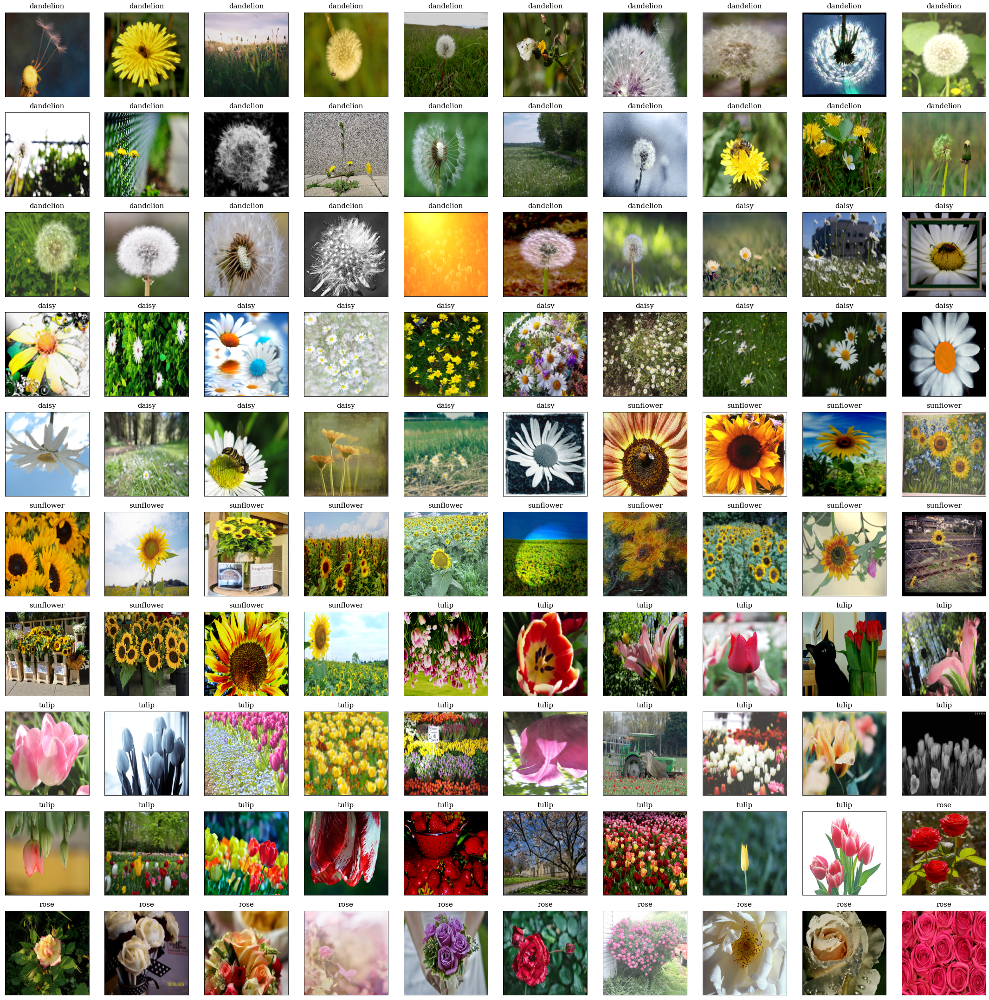

In [110]:
rows, cols = 10, 10
fig = plt.figure(figsize=(cols*3, rows*3))
for _ in range(rows * cols):
    item = dataset[_*40]
    label = item.label
    class_ = dataset.labels[label]
    image = item.image.permute(1, 2, 0).numpy()
    ax = fig.add_subplot(rows, cols, _+1)
    ax.imshow(image)
    ax.set_title(class_, fontsize=15, fontfamily="serif", y=1.02)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

fig.tight_layout()
fig.show()

<p style="font-size: 15px;">We see that some of images have other objects instead of flowers and it is impossible to remove them, because we don't know much there, so our neural network will degrade because of this noise!</p>

In [111]:
train_dataset, test_dataset = train_test_split(dataset, test_size=0.2)

print(f"Train Images: {len(train_dataset)}")
print(f"Test Images: {len(test_dataset)}")

Train Images: 3458
Test Images: 865


In [112]:
train_loader = DataLoader(train_dataset,
                          batch_size=config.batch_size,
                          shuffle=True, 
                          num_workers=config.num_workers,
                          pin_memory=True,
                          collate_fn=collate_fn)


test_loader = DataLoader(test_dataset,
                         batch_size=config.batch_size*2,
                         shuffle=False,
                         num_workers=config.num_workers,
                         pin_memory=True,
                         collate_fn=collate_fn)

<h1>Modelling ResNet50</h1>
 <p style="font-size: 15px;">I have choosed this architecture, because:</p>
<ul>
    <li> PyTorch provides this architecture in <b>torchvision.models</b> module
    <li> It uses <b>Residual Connections</b> approach, which avoids "gradient vanishing" and speed up the training.
    
</ul>

<img src="https://ichi.pro/assets/images/max/724/0*bBiMda6n_xKUCSnj.png" width=250 height=500>

<p style="font-size: 15px">In this image shows <b>ResNet34</b>, but only one differ from <b>ResNet50</b> it has 34 layers with Residual Connections, so <b>ResNet50</b> has 50 layers with Residual Connections.</p>

In [113]:
model = models.resnet50(pretrained=True)

In [114]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

<h1>Fine-Tuning (Transfer Learning)</h1>

<p style="font-size: 15px">We see that last (fc) last is for classification, thus we should change this layer by our version, and freeze layers above.</p> 

In [115]:
for parameter in model.parameters():
    parameter.require_grad = False
    
classifier = nn.Sequential(
    nn.Linear(in_features=2048, out_features=5),
    nn.Softmax(dim=1),
)
model.fc = classifier

<h1>Training</h1>

In [118]:
optimizer = AdamW(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()
scheduler = ReduceLROnPlateau(optimizer, patience=1)

trainer = Trainer(model=model, criterion=criterion, optimizer=optimizer, scheduler=scheduler, device=config.device)
trainer.fit(train_loader, validation_loader=test_loader, epochs=10)

Evaluating: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


<h2>Plotting Train & Validation Losses</h2>

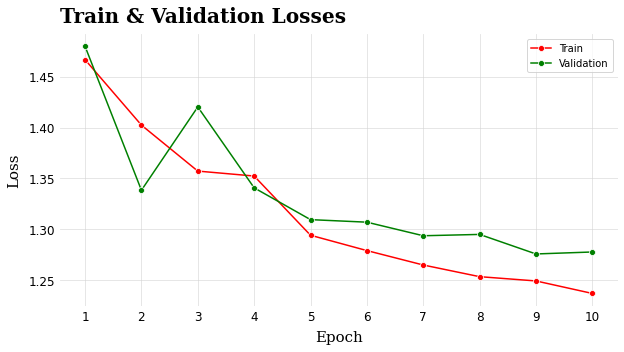

In [120]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.grid(color="lightgrey", axis="both", alpha=0.7, zorder=0)
sns.lineplot(x=trainer.logs.epochs, y=trainer.logs.train_loss, color="red", zorder=2, marker="o", label="Train", ax=ax)
sns.lineplot(x=trainer.logs.epochs, y=trainer.logs.validation_loss, label="Validation", color="green", marker="o", zorder=2, ax=ax)

for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

ax.xaxis.set_tick_params(labelsize=12, size=0, pad=5)
ax.yaxis.set_tick_params(labelsize=12, size=0, pad=5)
ax.set_title(label="Train & Validation Losses", fontweight="bold", fontfamily="serif", fontsize=20, y=1.02, loc="left")
ax.set_xlabel("Epoch", fontfamily="serif", fontsize=15,  labelpad=7)
ax.set_ylabel("Loss", fontfamily="serif", fontsize=15, labelpad=7)
ax.set_xticks(trainer.logs.epochs)

ax.legend()
fig.show()

<h1>Testing</h1>

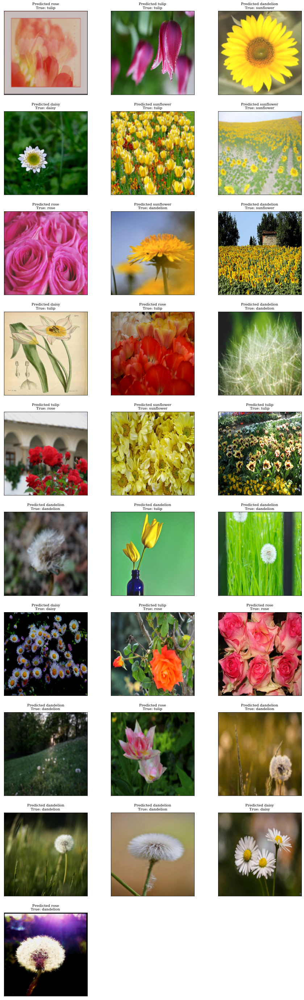

In [124]:
fig = plt.figure(figsize=(3*5, 10*5))
model.to(config.device)
model.eval()
with torch.no_grad():
    for idx, batch in enumerate(test_loader):
        torch.cuda.empty_cache()
        
        images = batch["images"].to(config.device)
        labels = batch["labels"].to("cpu")
        
        output = model(images).to("cpu")
        predicted_label = torch.argmax(output, dim=1)
        
        ax = fig.add_subplot(10, 3, idx+1)
        ax.imshow(images[0].cpu().permute(1, 2, 0))
        ax.set_title(f"Predicted {dataset.labels[predicted_label[0]]}\nTrue: {dataset.labels[labels[0]]}", fontsize=10, fontfamily="serif")
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)

fig.show()

<h1>References:</h1>
<h3>Libraries:</h3>
<ul>
    <li><a href="https://pytorch.org/">PyTorch - https://pytorch.org/</a>
    <li><a href="https://albumentations.ai/">Albumentations - https://albumentations.ai/</a>
    <li><a href="https://seaborn.pydata.org/">seaborn - https://seaborn.pydata.org/</a>
    <li><a href="https://matplotlib.org/">matplotlib - https://matplotlib.org/</a>
    <li><a href="https://tqdm.github.io/">tqdm - https://tqdm.github.io/</a> 
    <li><a href="https://github.com/mewwts/addict">addict - https://github.com/mewwts/addict</a>
    <li><a href="https://docs.python.org/3/library/os.html">os - https://docs.python.org/3/library/os.html</a>
    <li><a href="https://docs.python.org/3/library/random.html">random - https://docs.python.org/3/library/random.html</a>
    <li><a href="https://numpy.org/">numpy - https://numpy.org/</a>
    <li><a href="https://docs.python.org/3/library/datetime.html">datetime - https://docs.python.org/3/library/datetime.html</a>
    <li><a href="https://docs.python.org/3/library/logging.html">logging - https://docs.python.org/3/library/logging.html</a>
    <li><a href="https://python-pillow.org/">pillow - https://python-pillow.org/</a>
</ul>

<h3>Papers:</h3>
<ul>
    <li><a href="https://arxiv.org/abs/1512.03385">ResNet - https://arxiv.org/abs/1512.03385</a>
    <li><a href="https://arxiv.org/abs/1711.05101">Adam - https://arxiv.org/abs/1711.05101</a>
    <li><a href="https://machinelearningmastery.com/cross-entropy-for-machine-learning/">Cross Entropy Loss - https://machinelearningmastery.com/cross-entropy-for-machine-learning/</a>
    
</ul>